## Advanced Lane Finding Project

This NOTEBOOK does not contain the main code.  Instead it is used to turn the parameters and test the output of the main code, which is in tracktools.py




The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.



In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import imp #for reloading packages during testing

import tracktools

#%matplotlib qt
%matplotlib inline

In [2]:
def plot_processed(img,processed,filename,processed_name,colorbar=False):
    # Plot original with undistorted image
    f, (ax1, ax2) = plt.subplots(1, 2)
    f.tight_layout()
    
    ax1.imshow(img)
    ax1.set_title('Original Image')
    ax1.axis('off')
    
    cax = ax2.imshow(processed)
    ax2.set_title('%s Image'%processed_name)
    ax2.axis('off')
    
    if colorbar:
        f.colorbar(cax)
 
    plt.savefig(filename)
    
    return (ax1,ax2)

# Calibrate and display undistored images

In [207]:
# For testing
#saved = tracktools.ImageProcessor()
#saved.calibrate_camera()


In [3]:
# Calibrate camera
img_processor = tracktools.ImageProcessor()
img_processor.calibrate_camera()
#img_processor.calibrate_from_existing(saved)

Perspective warp not performed, transform matrix is None
Re-run ingest_image after setting warp points
Re-run ingest_image after ingesting a thresholder object 


(<matplotlib.axes._subplots.AxesSubplot at 0x291d3f22b0>,
 <matplotlib.axes._subplots.AxesSubplot at 0x291d44dd68>)

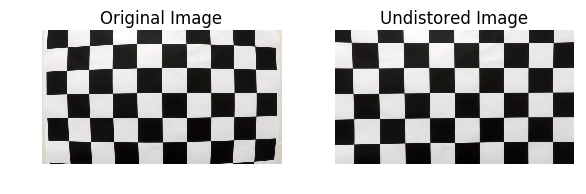

In [4]:
# View calibration checkerboard after undistorting
file_name = glob.glob('./camera_cal/calibration*.jpg')[0]
cal_img = tracktools.get_img_from_filename(file_name)
img_processor.ingest_image(cal_img)

plot_processed(cal_img,img_processor.img,'./output_images/undistored_checker.jpg','Undistored')

Perspective warp not performed, transform matrix is None
Re-run ingest_image after setting warp points
Re-run ingest_image after ingesting a thresholder object 


(<matplotlib.axes._subplots.AxesSubplot at 0x291d45ea20>,
 <matplotlib.axes._subplots.AxesSubplot at 0x291b8be780>)

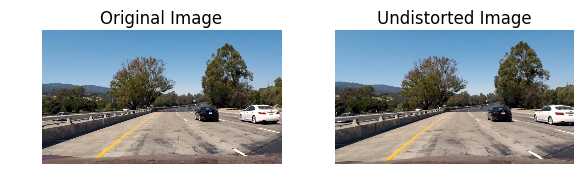

In [5]:
file_name = './test_images/test1.jpg'
img = tracktools.get_img_from_filename(file_name)

#img = frames_list[-1]
img_processor.ingest_image(img)
plot_processed(img,img_processor.img,'./output_images/undistored_road.jpg','Undistorted')

# Choose warp points

Perspective warp not performed, transform matrix is None
Re-run ingest_image after setting warp points
Re-run ingest_image after ingesting a thresholder object 


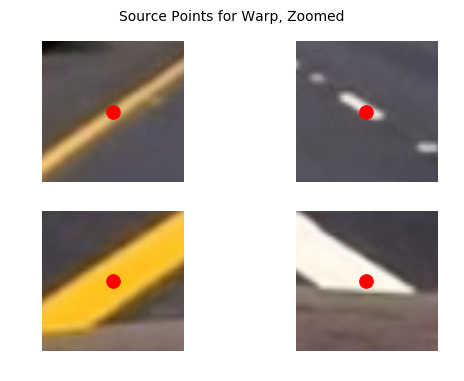

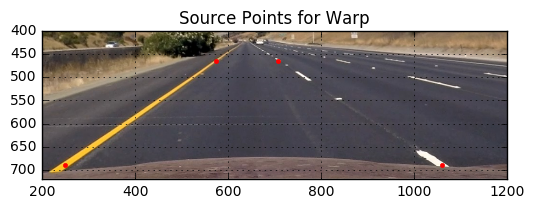

In [6]:
# Use this cell to set the source points for perspective transform
# Create a seperate image processor with straight lanes image
file_name = './test_images/straight_lines1.jpg'
straight_lanes_img = tracktools.get_img_from_filename(file_name)

straight_img_processor = tracktools.ImageProcessor()
straight_img_processor.calibrate_from_existing(img_processor)
straight_img_processor.ingest_image(straight_lanes_img)

# Choose source points

# Top and bottom
top_row = 465
bottom_row = 690

# Left
bottom_left = 248
top_left = 573

# Right
top_right=708
bottom_right=1060

# Set the points
straight_img_processor.set_warp_source_points(top_row,bottom_row,bottom_left,top_left,top_right,bottom_right)
img_processor.set_warp_source_points(top_row,bottom_row,bottom_left,top_left,top_right,bottom_right)

# Visualize warp source points
f,axarr = plt.subplots(2,2)
margin = 20

ordered_ax = [axarr[1,0],axarr[0,0],axarr[0,1],axarr[1,1]]

for ind,ax in enumerate(ordered_ax):
    ax.imshow(straight_img_processor.img)
    point = straight_img_processor.src[ind]
    ax.set_xlim(point[0]-margin, point[0] + margin)
    ax.set_ylim(point[1]+margin,point[1]-margin)
    ax.plot(point[0],point[1],'.',color='red',markersize=20)

# Format 
for ax in axarr.flatten():
    ax.axis('off')
plt.suptitle('Source Points for Warp, Zoomed')
plt.savefig('./output_images/warp_source_zoomed.jpg')

plt.figure()
plt.imshow(straight_img_processor.img)
for dot in straight_img_processor.src:
    plt.plot(*dot,marker='.',color='red')
plt.title('Source Points for Warp')
plt.xlim(200,1200)
plt.ylim(straight_img_processor.num_rows,400)
plt.grid()

plt.savefig('./output_images/warp_source.jpg')


Re-run ingest_image after ingesting a thresholder object 


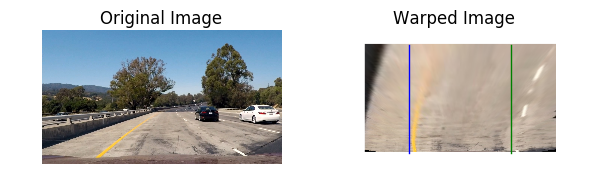

In [7]:
# Visualize warping
# Re-ingest because warping now defined
img_processor.ingest_image(img)

ax1,ax2 = plot_processed(img,img_processor.warped,'./output_images/warped_road.jpg','Warped')
ax2.plot([300,300],[0,img.shape[0]])
ax2.plot([img.shape[1]-300,img.shape[1]-300],[0,img.shape[0]])
#ax2.set_ylim(0,img.shape[0])

# Create binary images

(<matplotlib.axes._subplots.AxesSubplot at 0x2926476a20>,
 <matplotlib.axes._subplots.AxesSubplot at 0x29264ac6a0>)

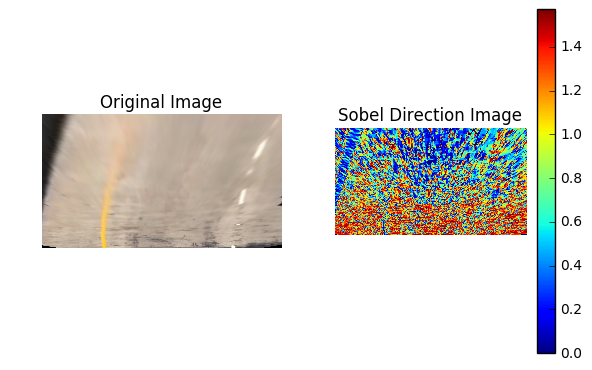

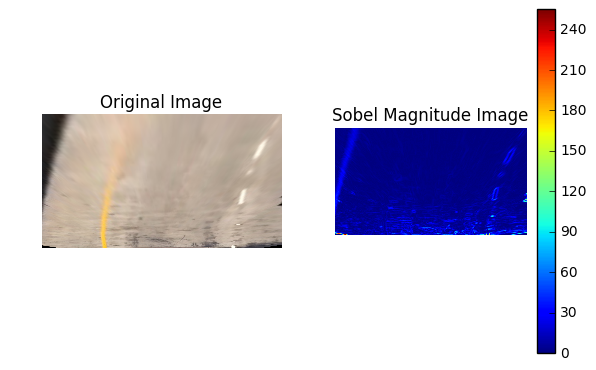

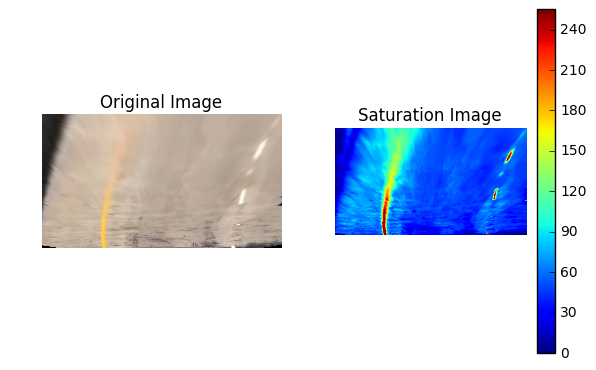

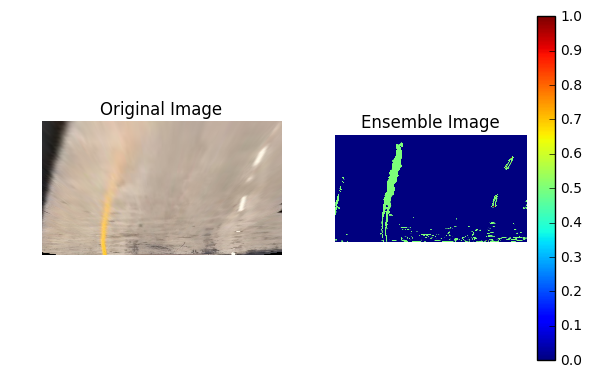

In [8]:
# Select thresholding to get binary image

sobel_kernel = 15
dir_thresh = (0,0.4)
mag_thresh = (30,100)
s_thresh = (120,220)

# Set up the thresholding class
thresher = tracktools.Thresher(sobel_kernel,dir_thresh,mag_thresh,s_thresh)
img_processor.ingest_thresher(thresher)
img_processor.ingest_image(img)

# Apply thresholds
sobel_direction_binary = thresher.sobel_direction_threshold(img_processor.warped_gray)
sobel_magnitude_binary = thresher.sobel_magnitude_threshold(img_processor.warped_gray)
saturation_binary = thresher.saturation_threshold(img_processor.warped)
combined_binary = thresher.get_binary(img_processor,thresh=0.5)


# Plot resulting derived images to decide on thresholds
plot_processed(img_processor.warped,thresher.absgraddir
              ,'./output_images/sobel_dir.jpg','Sobel Direction',colorbar=True)

plot_processed(img_processor.warped,thresher.gradmag
              ,'./output_images/sobel_mag.jpg','Sobel Magnitude',colorbar=True)

plot_processed(img_processor.warped,thresher.s_channel
              ,'./output_images/satuation.jpg','Saturation',colorbar=True)

plot_processed(img_processor.warped,thresher.ensemble
              ,'./output_images/satuation.jpg','Ensemble',colorbar=True)

(<matplotlib.axes._subplots.AxesSubplot at 0x2927c2acf8>,
 <matplotlib.axes._subplots.AxesSubplot at 0x2927cb82e8>)

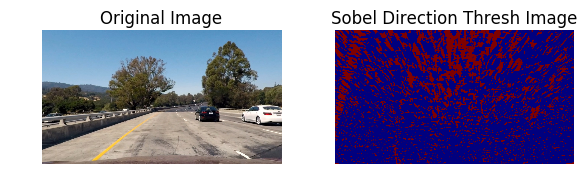

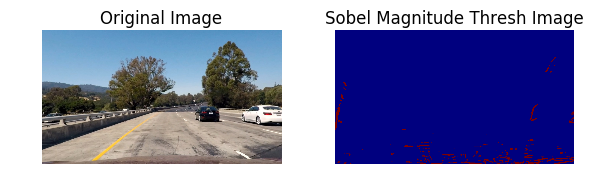

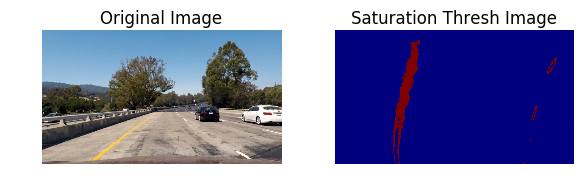

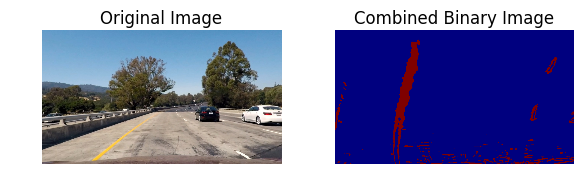

In [9]:
# Plot resulting binaries from thresholds

plot_processed(img_processor.img,sobel_direction_binary
              ,'./output_images/sobel_dir_bin.jpg','Sobel Direction Thresh')

plot_processed(img_processor.img,sobel_magnitude_binary
              ,'./output_images/sobel_mag_bin.jpg','Sobel Magnitude Thresh')

plot_processed(img_processor.img,saturation_binary
              ,'./output_images/satuation_bin.jpg','Saturation Thresh')

plot_processed(img_processor.img,combined_binary
              ,'./output_images/combined_bin.jpg','Combined Binary')

# Set up lane trackers and verifier

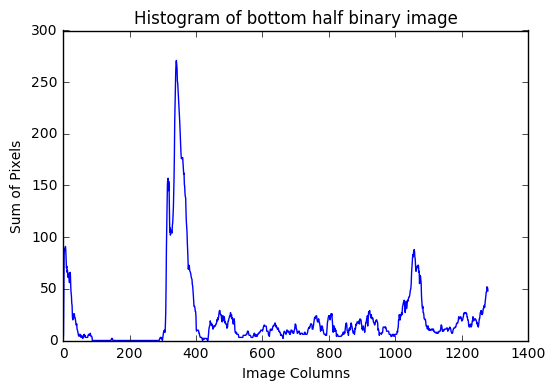

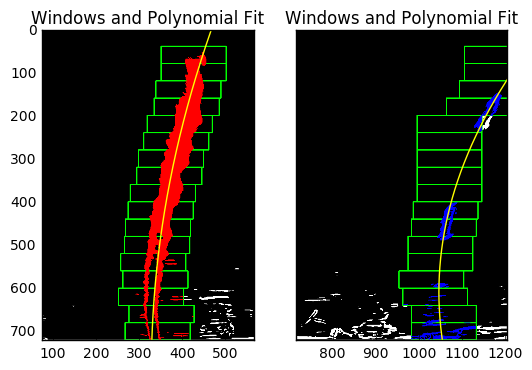

In [10]:
# Select window width and height to find lanes

window_height=40
window_width=150
minpix=50

xm_per_pix = 3.7/672 # meters per pixel in x dimension
ym_per_pix = 3/65 # meters per pixel in y dimension

left_tracker = tracktools.LaneTracker('left',xm_per_pix,ym_per_pix
                                ,window_height,window_width,minpix)

right_tracker = tracktools.LaneTracker('right',xm_per_pix,ym_per_pix
                                ,window_height,window_width,minpix)

lv = tracktools.LaneVerifier()

left_tracker.find_lane(img_processor,draw=True)
right_tracker.find_lane(img_processor,draw=True)
img_processor.ingest_lanes(left_tracker,right_tracker,lv)


# Plotting
plt.plot(left_tracker.histogram)
plt.xlabel('Image Columns')
plt.ylabel('Sum of Pixels')
plt.title('Histogram of bottom half binary image')
plt.savefig('./output_images/binary_histogram.jpg')

plt.figure()
f,axarr = plt.subplots(1,2,sharey=True)
for ax,tracker in zip(axarr,[left_tracker,right_tracker]):    
    ax.imshow(tracker.out_img)
    ax.plot(tracker.poly_cols,tracker.poly_rows,color='yellow')
    
    # Formatting
    ax.set_title('Windows and Polynomial Fit')    
    ax.set_ylim(tracker.out_img.shape[0],0)
    #ax.axis('off')
    if tracker == left_tracker:
        ax.set_xlim(0,int(tracker.out_img.shape[1]/2))
    else:
        ax.set_xlim(int(tracker.out_img.shape[1]/2),tracker.out_img.shape[1])
    
        
plt.savefig('./output_images/windows_polynomial.jpg')

# Warp back to camera image

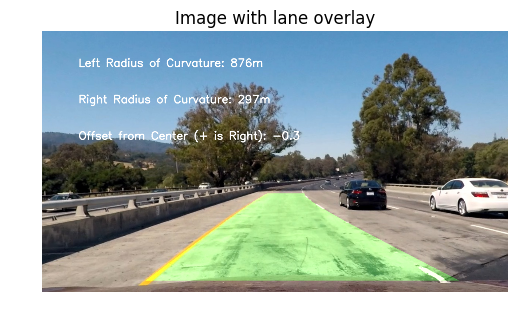

In [11]:
plt.imshow(img_processor.overlayed)
plt.axis('off')
plt.title('Image with lane overlay')
plt.savefig('./output_images/overlaid.jpg')

# View test sample images

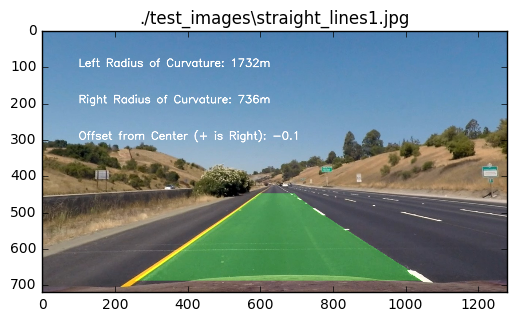

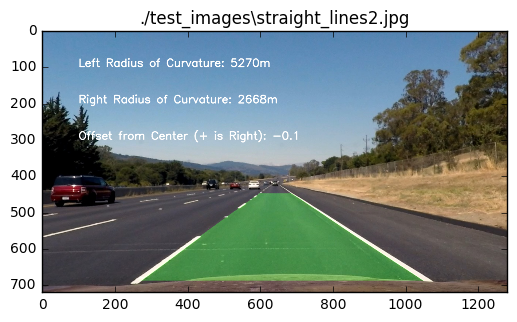

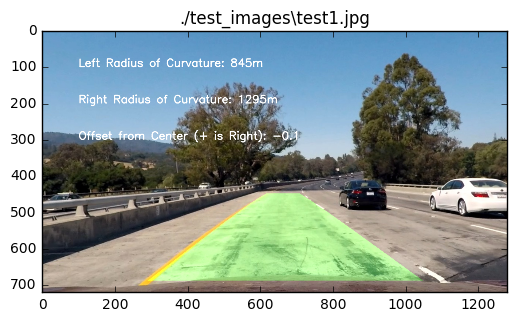

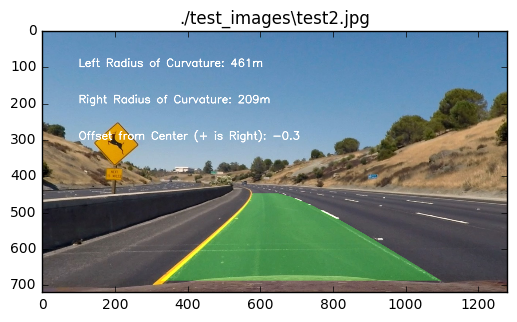

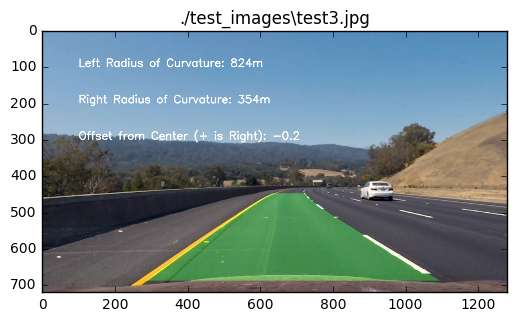

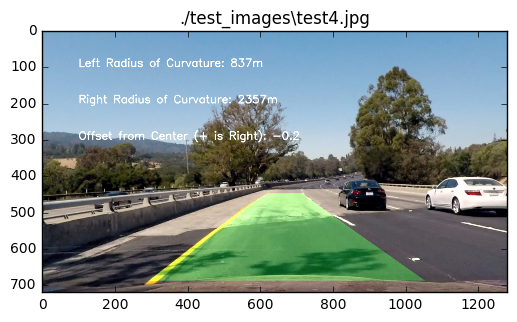

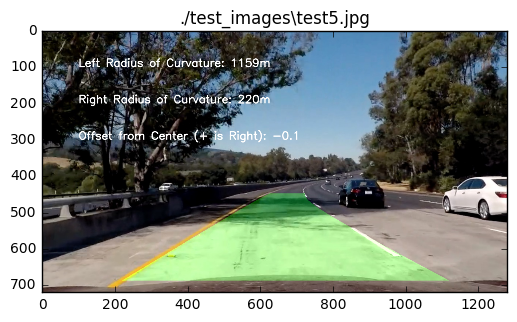

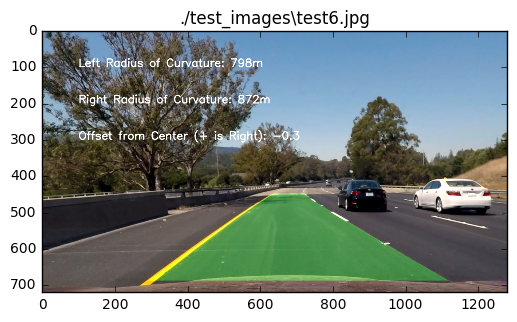

In [12]:
def process_image(img):

    img_processor.ingest_image(img)
    left_tracker.find_lane(img_processor)
    right_tracker.find_lane(img_processor)
    img_processor.ingest_lanes(left_tracker,right_tracker,lv)
    
    return img_processor.overlayed

# Choose image to test and tune on
for file_name in glob.glob('./test_images/*.jpg'):
    # Reset the verifier (to clear the history in it) at each test image
    lv = tracktools.LaneVerifier()

    img = tracktools.get_img_from_filename(file_name)
    overlayed = process_image(img)

    plt.figure()
    plt.imshow(overlayed)
    plt.title(file_name)

In [13]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

# View problematic frames in video

In [14]:
clip = VideoFileClip("project_video.mp4")
frames = list(clip.iter_frames())

In [15]:
def get_frames(sec_in_video):
    
    fraction_in_video = sec_in_video/50
    frame_num = int(fraction_in_video*len(frames))
    
    return frames[frame_num-5:frame_num+15]

frames_list = get_frames(41)

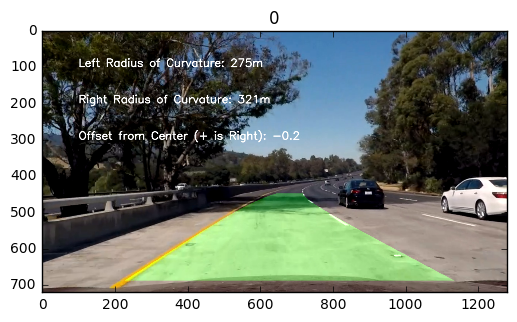

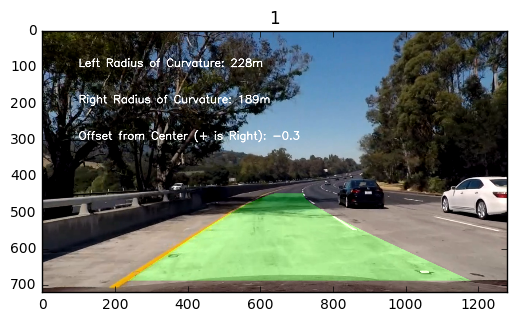

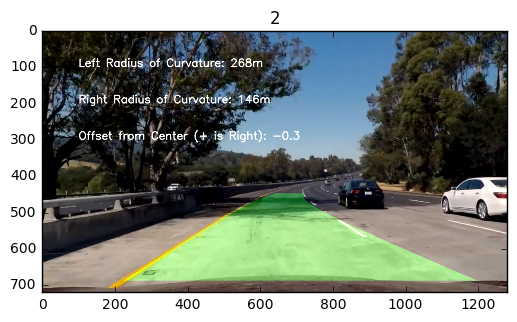

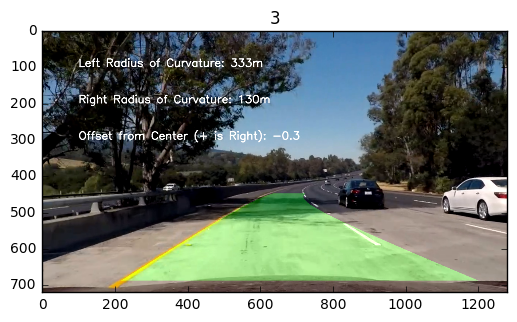

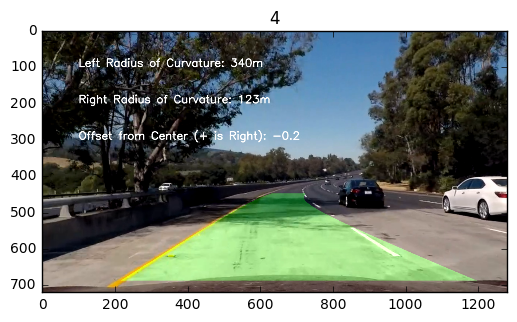

...

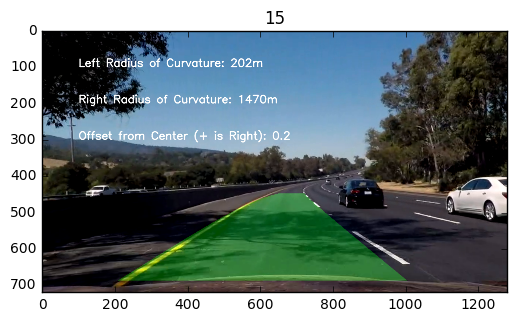

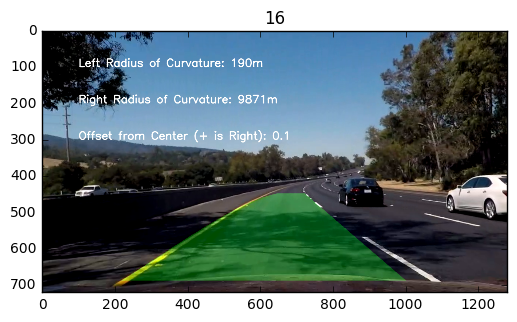

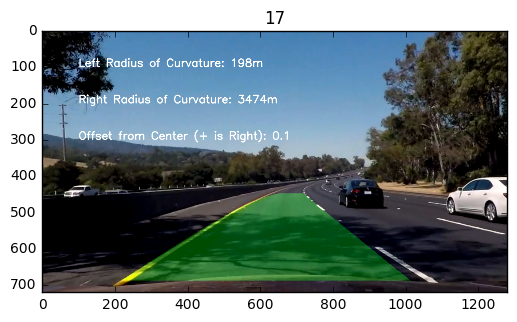

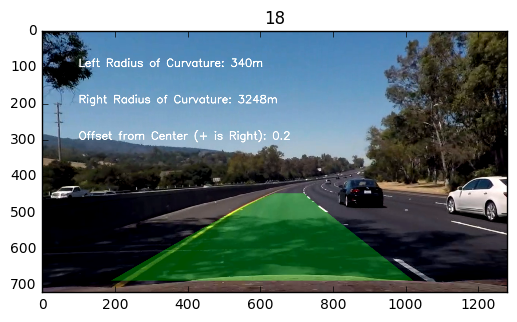

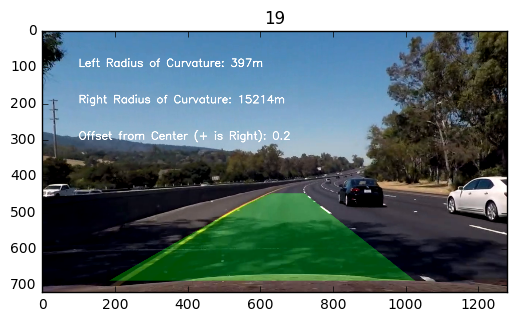

In [16]:
frames_list = get_frames(41)    
lv = tracktools.LaneVerifier()
for ind,img in enumerate(frames_list):   
    overlayed = process_image(img)

    plt.figure()
    plt.imshow(overlayed)
    plt.title(ind)

# Compile Video

In [17]:
lv = tracktools.LaneVerifier()
def compile_video():
    # Import everything needed to edit/save/watch video clips

    white_output = 'project_output.mp4'
    clip1 = VideoFileClip("project_video.mp4")
    white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
    %time white_clip.write_videofile(white_output, audio=False)
   
    return white_output

output = compile_video()    

[MoviePy] >>>> Building video project_output.mp4
[MoviePy] Writing video project_output.mp4


100%|█████████████████████████████████████▉| 1260/1261 [08:50<00:00,  2.37it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_output.mp4 

Wall time: 8min 52s


In [18]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))
    
